# Notebook: traitement des données et analyse exploratoire

# Import des données

In [ ]:
# Connecte le notebook Colab à Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import de librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno

In [ ]:
# Chargement des datasets
olist_customers_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_customers_dataset.csv').drop_duplicates()
olist_order_items_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_order_items_dataset.csv').drop_duplicates()
olist_order_payments_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_order_payments_dataset.csv').drop_duplicates()
olist_order_reviews_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_order_reviews_dataset.csv').drop_duplicates()
olist_orders_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_orders_dataset.csv').drop_duplicates()
olist_products_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_products_dataset.csv').drop_duplicates()
olist_sellers_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_sellers_dataset.csv').drop_duplicates()

# à joindre deux fois: pour les customers et pour les sellers
olist_geolocation_dataset = pd.read_csv('drive/MyDrive/POlist/data/olist_geolocation_dataset.csv').drop_duplicates()


# Trad
product_category_name_translation = pd.read_csv('drive/MyDrive/POlist/data/product_category_name_translation.csv').drop_duplicates()

In [ ]:
# Check
olist_geolocation_dataset

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000155,99965,-28.180655,-52.034367,agua santa,RS
1000156,99950,-28.072188,-52.011272,tapejara,RS
1000157,99950,-28.068864,-52.012964,tapejara,RS
1000158,99950,-28.068639,-52.010705,tapejara,RS


In [ ]:
# Group by des latitudes et longitudes par ZipCode (la clé commune pour jointure)
geo = olist_geolocation_dataset.groupby('geolocation_zip_code_prefix').agg(
    # moyenne des latitudes par CP
    lat=('geolocation_lat', 'mean'),
    # moyenne des longitudes par CP
    lng=('geolocation_lng', 'mean')    
)

In [ ]:
# Check
geo

,lat,lng
geolocation_zip_code_prefix,,
1001,-23.550227,-46.634039
1002,-23.547657,-46.634991
1003,-23.549000,-46.635582
1004,-23.549829,-46.634792
1005,-23.549547,-46.636406
...,...,...
99960,-27.953722,-52.025511
99965,-28.183372,-52.039850
99970,-28.343920,-51.874988


### Variables du dataset et définitions

**customer_id**:
key to the orders dataset. Each order has a unique customer_id.

**customer_unique_id**:
unique identifier of a customer.

**customer_zip_code_prefix**:
first five digits of customer zip code

**customer_city**:
customer city name

**customer_state**:
customer state

**order_id**:
order unique identifier

**order_item_id**:
sequential number identifying number of items included in the same order.

**product_id**:
product unique identifier

**seller_id**:
seller unique identifier

**shipping_limit_date**:
Shows the seller shipping limit date for handling the order over to the logistic partner.

**price**:
item price

**freight_value**:
item freight value item (if an order has more than one item the freight value is splitted between items)

**order_id**:
unique identifier of an order.

**payment_sequential**:
a customer may pay an order with more than one payment method. If he does so, a sequence will be created to accommodate all payments.

**payment_type**:
method of payment chosen by the customer.

**payment_installments**:
number of installments chosen by the customer.

**payment_value**:
transaction value.

**review_id**:
unique review identifier

**order_id**:
unique order identifier

**review_score**:
Note ranging from 1 to 5 given by the customer on a satisfaction survey.

**review_comment_title**:
Comment title from the review left by the customer, in Portuguese.

**review_comment_message**:
Comment message from the review left by the customer, in Portuguese.

**review_creation_date**:
Shows the date in which the satisfaction survey was sent to the customer.

**review_answer_timestamp**:
Shows satisfaction survey answer timestamp.

**order_id**:
unique identifier of the order.

**customer_id**:
key to the customer dataset. Each order has a unique customer_id.

**order_status**:
Reference to the order status (delivered, shipped, etc).

**order_purchase_timestamp**:
Shows the purchase timestamp.

**order_approved_at**:
Shows the payment approval timestamp.

**order_delivered_carrier_date**:
Shows the order posting timestamp. When it was handled to the logistic partner.

**order_delivered_customer_date**:
Shows the actual order delivery date to the customer.

**order_estimated_delivery_date**:
Shows the estimated delivery date that was informed to customer at the purchase moment.

**product_id**:
unique product identifier

**product_category_name**:
root category of product, in Portuguese.

**product_name_lenght**:
number of characters extracted from the product name.

**product_description_lenght**:
number of characters extracted from the product description.

**product_photos_qty**:
number of product published photos

**product_weight_g**:
product weight measured in grams.

**product_length_cm**:
product length measured in centimeters.

**product_height_cm**:
product height measured in centimeters.

**product_width_cm**:
product width measured in centimeters.

**product_category_name**:
category name in Portuguese

**product_category_name_english**:
category name in English

## Groupement/jointure des différents fichiers

Le schéma de BDD disponible avec le dataset nous permet de joindre tous les fichiers grâce aux clés communes indiquées:

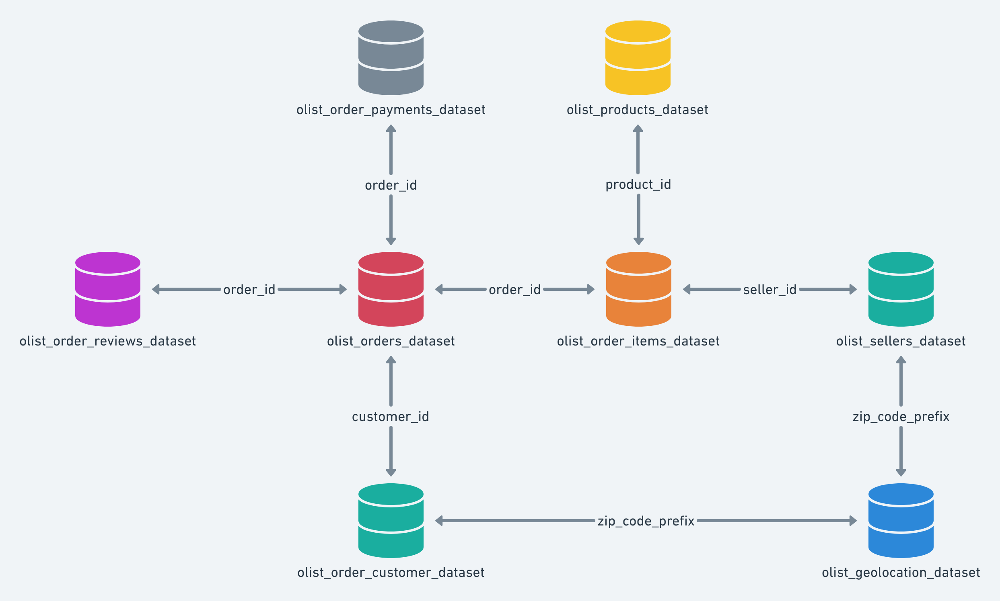

In [ ]:
# jointure des différents fichiers
df = olist_orders_dataset.merge(
      olist_order_payments_dataset, on='order_id', how='inner').merge(
       olist_order_reviews_dataset, on='order_id', how='inner').merge(
        olist_order_items_dataset, on='order_id', how='inner').merge(
         olist_products_dataset, on='product_id', how='inner').merge(
          olist_customers_dataset, on='customer_id', how='inner').merge(
           product_category_name_translation, on='product_category_name', how='inner').merge(
            olist_sellers_dataset, on='seller_id', how='inner').merge(
                            geo,
                            how='inner',
                            left_on='customer_zip_code_prefix',
                            right_on='geolocation_zip_code_prefix'
                            )

In [ ]:
# Rename des colonnes de position longitude et latitude
df=df.rename(columns = {'lat':'customer_lat'})
df=df.rename(columns = {'lng':'customer_lon'})

In [ ]:
# Check
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,customer_lat,customer_lon
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077
3,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b080d193f98b0505af,delivered,2018-03-22 17:23:21,2018-03-22 18:05:36,2018-03-23 18:03:03,2018-03-25 17:22:41,2018-04-04 00:00:00,1,credit_card,...,8a4002923e801e3120a11070fd31c9e2,3149,sao paulo,SP,bed_bath_table,13405,piracicaba,SP,-23.577482,-46.587077
4,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b080d193f98b0505af,delivered,2018-03-22 17:23:21,2018-03-22 18:05:36,2018-03-23 18:03:03,2018-03-25 17:22:41,2018-04-04 00:00:00,1,credit_card,...,8a4002923e801e3120a11070fd31c9e2,3149,sao paulo,SP,bed_bath_table,13405,piracicaba,SP,-23.577482,-46.587077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115294,fa752aebeda0a3f9a2626bc507550c3f,1674724f5fe22d2cf3420bb5f2511c9a,delivered,2018-07-17 13:27:40,2018-07-17 13:41:32,2018-07-19 14:12:00,2018-07-26 17:51:54,2018-08-07 00:00:00,1,credit_card,...,fa094305fdb6062436c99adba7d53dde,74455,goiania,GO,costruction_tools_tools,37540,sao paulo,SP,-16.651190,-49.320685
115295,fa752aebeda0a3f9a2626bc507550c3f,1674724f5fe22d2cf3420bb5f2511c9a,delivered,2018-07-17 13:27:40,2018-07-17 13:41:32,2018-07-19 14:12:00,2018-07-26 17:51:54,2018-08-07 00:00:00,1,credit_card,...,fa094305fdb6062436c99adba7d53dde,74455,goiania,GO,costruction_tools_tools,37540,sao paulo,SP,-16.651190,-49.320685
115296,37a7476e58da10721b5e55ba4be6807d,8caeb53ff1ed9da844ec4e1f6bab7dd8,delivered,2017-12-06 20:22:29,2017-12-06 20:33:01,2017-12-11 17:30:14,2017-12-12 22:14:31,2017-12-22 00:00:00,2,credit_card,...,a6d9bf9bd00ca98f44894adab0578a6f,70422,brasilia,DF,furniture_mattress_and_upholstery,73020,brasilia,DF,-15.824902,-47.892586
115297,37a7476e58da10721b5e55ba4be6807d,8caeb53ff1ed9da844ec4e1f6bab7dd8,delivered,2017-12-06 20:22:29,2017-12-06 20:33:01,2017-12-11 17:30:14,2017-12-12 22:14:31,2017-12-22 00:00:00,1,credit_card,...,a6d9bf9bd00ca98f44894adab0578a6f,70422,brasilia,DF,furniture_mattress_and_upholstery,73020,brasilia,DF,-15.824902,-47.892586


In [ ]:
# Jointure des données geographique des vendeurs
df = df.merge(geo,
              how='left',
              left_on='seller_zip_code_prefix',
              right_on='geolocation_zip_code_prefix',
              )

# Rename des colonnes de position longitude et latitude
df=df.rename(columns = {'lat':'seller_lat'})
df=df.rename(columns = {'lng':'seller_lon'})

# Check
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,customer_city,customer_state,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,customer_lat,customer_lon,seller_lat,seller_lon
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,...,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077,-23.680862,-46.444311
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,...,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077,-23.680862,-46.444311
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,...,sao paulo,SP,housewares,9350,maua,SP,-23.577482,-46.587077,-23.680862,-46.444311
3,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b080d193f98b0505af,delivered,2018-03-22 17:23:21,2018-03-22 18:05:36,2018-03-23 18:03:03,2018-03-25 17:22:41,2018-04-04 00:00:00,1,credit_card,...,sao paulo,SP,bed_bath_table,13405,piracicaba,SP,-23.577482,-46.587077,-22.708485,-47.664918
4,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b080d193f98b0505af,delivered,2018-03-22 17:23:21,2018-03-22 18:05:36,2018-03-23 18:03:03,2018-03-25 17:22:41,2018-04-04 00:00:00,1,credit_card,...,sao paulo,SP,bed_bath_table,13405,piracicaba,SP,-23.577482,-46.587077,-22.708485,-47.664918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115294,fa752aebeda0a3f9a2626bc507550c3f,1674724f5fe22d2cf3420bb5f2511c9a,delivered,2018-07-17 13:27:40,2018-07-17 13:41:32,2018-07-19 14:12:00,2018-07-26 17:51:54,2018-08-07 00:00:00,1,credit_card,...,goiania,GO,costruction_tools_tools,37540,sao paulo,SP,-16.651190,-49.320685,-22.246366,-45.706828
115295,fa752aebeda0a3f9a2626bc507550c3f,1674724f5fe22d2cf3420bb5f2511c9a,delivered,2018-07-17 13:27:40,2018-07-17 13:41:32,2018-07-19 14:12:00,2018-07-26 17:51:54,2018-08-07 00:00:00,1,credit_card,...,goiania,GO,costruction_tools_tools,37540,sao paulo,SP,-16.651190,-49.320685,-22.246366,-45.706828
115296,37a7476e58da10721b5e55ba4be6807d,8caeb53ff1ed9da844ec4e1f6bab7dd8,delivered,2017-12-06 20:22:29,2017-12-06 20:33:01,2017-12-11 17:30:14,2017-12-12 22:14:31,2017-12-22 00:00:00,2,credit_card,...,brasilia,DF,furniture_mattress_and_upholstery,73020,brasilia,DF,-15.824902,-47.892586,-15.657600,-47.809413
115297,37a7476e58da10721b5e55ba4be6807d,8caeb53ff1ed9da844ec4e1f6bab7dd8,delivered,2017-12-06 20:22:29,2017-12-06 20:33:01,2017-12-11 17:30:14,2017-12-12 22:14:31,2017-12-22 00:00:00,1,credit_card,...,brasilia,DF,furniture_mattress_and_upholstery,73020,brasilia,DF,-15.824902,-47.892586,-15.657600,-47.809413


In [ ]:
import datetime

# Gestion des dates

# colonnes comportant des dates
cols_date = ['order_purchase_timestamp',
             'order_approved_at',
             'order_delivered_carrier_date',
             'order_delivered_customer_date',
             'order_estimated_delivery_date',
             'review_creation_date',
             'review_answer_timestamp',
             'shipping_limit_date']

# convert au bon Dtype et arrondi à la journée
for col in cols_date:
    df[col] = pd.to_datetime(df[col])
    df[col] = df[col].dt.round("D")


In [ ]:
# Doublons commandes
df[df['order_id'].duplicated() == True].sort_values(by=['order_id'])

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,customer_city,customer_state,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,customer_lat,customer_lon,seller_lat,seller_lon
103049,0008288aa423d2a3f00fcb17cd7d8719,2355af7c75e7c98b43a87b2a7f210dc5,delivered,2018-02-14,2018-02-15,2018-02-21,2018-02-27,2018-03-06,1,boleto,...,jandira,SP,garden_tools,15025,sao jose do rio preto,SP,-23.532731,-46.901808,-20.806162,-49.388730
101200,0016dfedd97fc2950e388d2971d718c7,2c8b917c5d7dd720ebe36a5ed3b501ec,delivered,2017-04-29,2017-04-29,2017-05-16,2017-05-23,2017-06-01,1,credit_card,...,canavieiras,BA,garden_tools,4041,sao paulo,SP,-15.673675,-38.949596,-23.601417,-46.644406
68910,001ab0a7578dd66cd4b0a71f5b6e1e41,8bb3bef4e75a95524235cdc11a7331af,delivered,2017-12-27,2017-12-28,2017-12-29,2018-01-18,2018-01-29,1,boleto,...,salvador,BA,electronics,72015,brasilia,DF,-12.971245,-38.501123,-15.838156,-48.053470
68911,001ab0a7578dd66cd4b0a71f5b6e1e41,8bb3bef4e75a95524235cdc11a7331af,delivered,2017-12-27,2017-12-28,2017-12-29,2018-01-18,2018-01-29,1,boleto,...,salvador,BA,electronics,72015,brasilia,DF,-12.971245,-38.501123,-15.838156,-48.053470
99310,001d8f0e34a38c37f7dba2a37d4eba8b,d987da9fb4086ab7c2c0f83963cd6722,delivered,2017-05-15,2017-05-15,2017-05-25,2017-05-27,2017-05-24,1,credit_card,...,sao paulo,SP,health_beauty,1031,sao paulo,SP,-23.492950,-46.706192,-23.541644,-46.635066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21008,ffecd5a79a0084f6a592288c67e3c298,8afa5a415d65a08e3a68b1d7f9ddd8a5,delivered,2018-02-28,2018-02-28,2018-03-01,2018-03-30,2018-03-22,1,credit_card,...,salvador,BA,electronics,1212,sao paulo,SP,-12.992558,-38.453997,-23.538540,-46.639356
84027,fff8287bbae429a99bb7e8c21d151c41,6c1e92a209dbf868706caa831090941e,delivered,2018-03-18,2018-03-18,2018-03-22,2018-04-07,2018-04-19,1,credit_card,...,joao pessoa,PB,computers_accessories,12327,jacarei,SP,-7.179253,-34.869561,-23.302362,-45.971900
99831,fffb9224b6fc7c43ebb0904318b10b5f,4d3abb73ceb86353aeadbe698aa9d5cb,delivered,2017-10-28,2017-10-28,2017-11-11,2017-11-18,2017-11-27,1,boleto,...,serra talhada,PE,watches_gifts,24440,sao goncalo,RJ,-7.990556,-38.289161,-22.827569,-43.054869
99832,fffb9224b6fc7c43ebb0904318b10b5f,4d3abb73ceb86353aeadbe698aa9d5cb,delivered,2017-10-28,2017-10-28,2017-11-11,2017-11-18,2017-11-27,1,boleto,...,serra talhada,PE,watches_gifts,24440,sao goncalo,RJ,-7.990556,-38.289161,-22.827569,-43.054869


Il s'agit de doublons sur l'ensemble des colonnes, sauf pour le nombre de produit. Le dataset a autant de ligne que de quantité de produit commandé.

On garde uniquement la ligne avec le order_item_id	le plus élevé

In [ ]:
# Suppression des doublons
df = df.sort_values(by=['order_item_id'])
df = df.drop_duplicates(subset=['order_id'], keep='last')

# Check si présence de doublons
df[df['order_id'].duplicated() == True].sort_values(by=['order_id'])

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,customer_city,customer_state,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,customer_lat,customer_lon,seller_lat,seller_lon


# Traitement des valeurs manquantes

In [ ]:
# Info
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96249 entries, 74645 to 74795
Data columns (total 44 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96249 non-null  object        
 1   customer_id                    96249 non-null  object        
 2   order_status                   96249 non-null  object        
 3   order_purchase_timestamp       96249 non-null  datetime64[ns]
 4   order_approved_at              96236 non-null  datetime64[ns]
 5   order_delivered_carrier_date   95293 non-null  datetime64[ns]
 6   order_delivered_customer_date  94228 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96249 non-null  datetime64[ns]
 8   payment_sequential             96249 non-null  int64         
 9   payment_type                   96249 non-null  object        
 10  payment_installments           96249 non-null  int64         
 11  payment_val

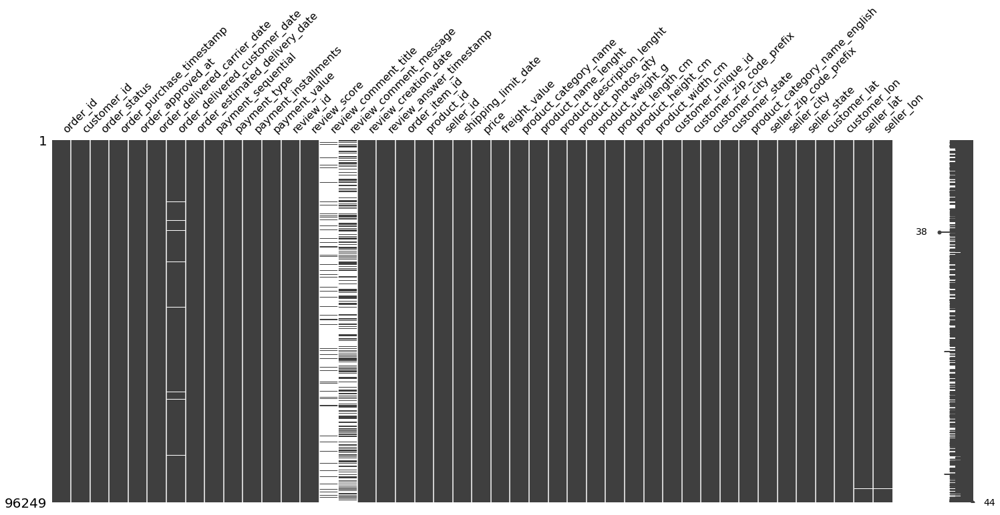

In [ ]:
# Check la présence de NaNs
msno.matrix(df)

Je choisi de me séparer des données sans latitude, longitude, et sans date de livraison.

Je conserve en revanche les observation sans commentaires écris car:
- leur nombre est trop important (la grand emajorité du dataset)
- distinguer les individus ayant laissé une review écrite peut être une caractéristique intéressant d'un point du vue métier.

In [ ]:
# Drop les observation sans latitude, longitude, et sans date de livraison
df = df.dropna(subset=['seller_lat', 'seller_lon', 'order_delivered_customer_date', 'order_approved_at'])

# EDA

In [ ]:
for col in df.columns:
  print(col, ' : ', df[col].nunique())

order_id  :  94002
customer_id  :  94002
order_status  :  2
order_purchase_timestamp  :  613
order_approved_at  :  608
order_delivered_carrier_date  :  590
order_delivered_customer_date  :  655
order_estimated_delivery_date  :  444
payment_sequential  :  13
payment_type  :  4
payment_installments  :  24
payment_value  :  27269
review_id  :  93579
review_score  :  5
review_comment_title  :  4322
review_comment_message  :  33723
review_creation_date  :  626
review_answer_timestamp  :  701
order_item_id  :  17
product_id  :  30348
seller_id  :  2889
shipping_limit_date  :  552
price  :  5680
freight_value  :  6633
product_category_name  :  71
product_name_lenght  :  65
product_description_lenght  :  2935
product_photos_qty  :  19
product_weight_g  :  2149
product_length_cm  :  99
product_height_cm  :  102
product_width_cm  :  94
customer_unique_id  :  91019
customer_zip_code_prefix  :  14669
customer_city  :  4023
customer_state  :  27
product_category_name_english  :  71
seller_zip_code_

## Histogrammes des variables quantitatives

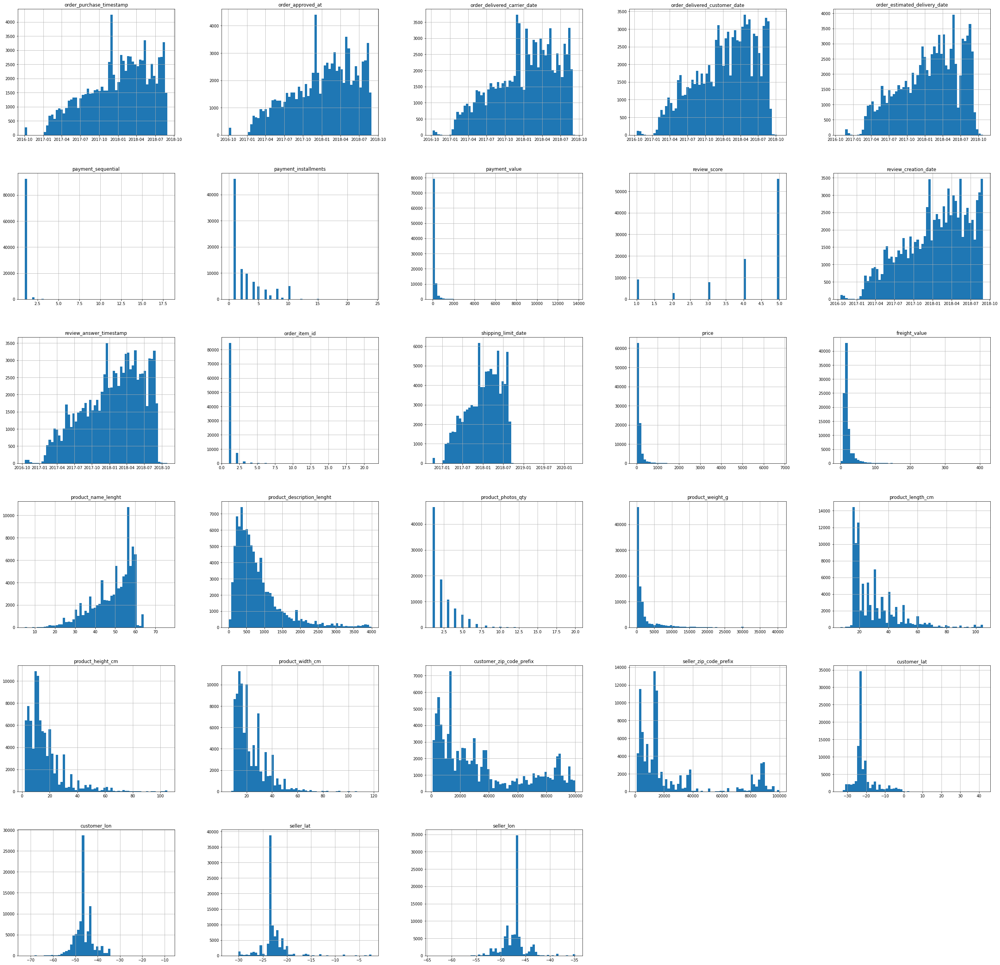

In [ ]:
# Histogramme
df.hist(bins=60, figsize=(45, 45))
plt.show()

## Histogramme des variables catégorielles

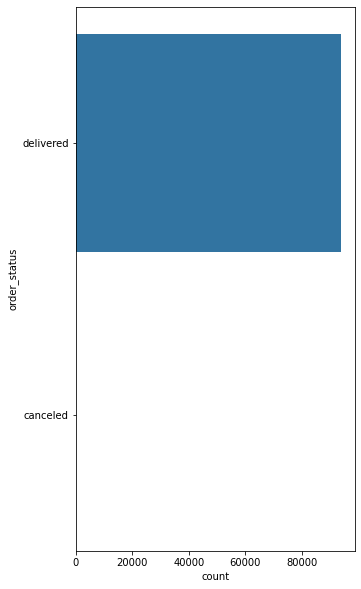

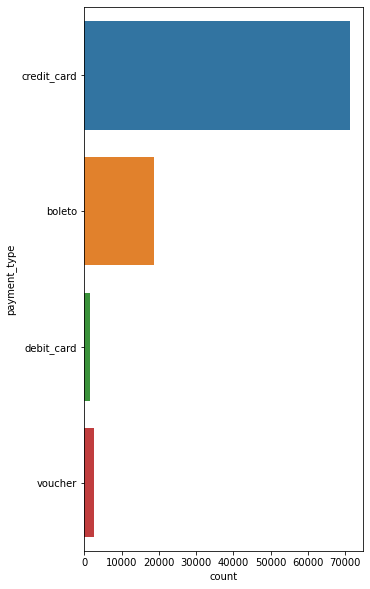

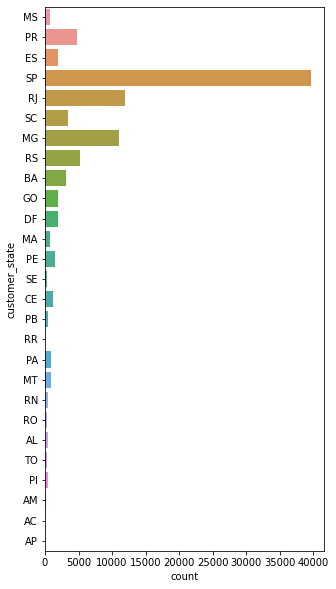

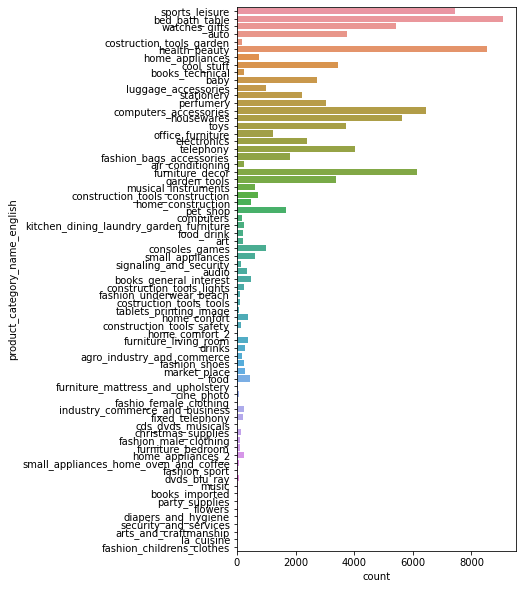

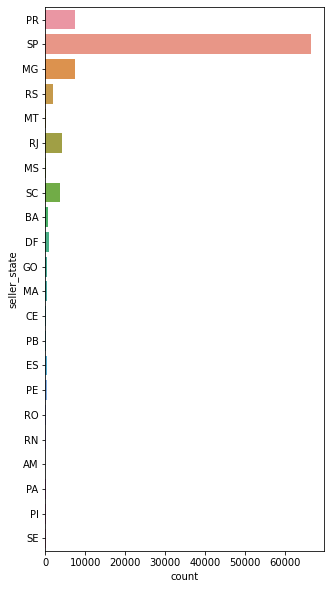

In [ ]:
# Liste des variables catégorielles
cat_var = [
    "order_status",
    "payment_type",
    "customer_state",
    "product_category_name_english",
    "seller_state",
]

# Countplot pour chaque variable catégorielle
for cols in cat_var:

    plt.figure(figsize=(5, 10))

    sns.countplot(y=cols, data=df)



In [ ]:
# Statistiques descriptives
df.describe()

,payment_sequential,payment_installments,payment_value,review_score,order_item_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,seller_zip_code_prefix,customer_lat,customer_lon,seller_lat,seller_lon
count,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94001.000000,94001.000000,94001.000000,94001.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000,94002.000000
mean,1.022797,2.913725,157.161891,4.157507,1.141614,125.098878,20.157209,48.859737,793.388907,2.245048,2098.363528,30.111414,16.478474,23.029861,35119.798185,24736.152188,-21.203379,-46.192007,-22.792619,-47.235496
std,0.227524,2.707859,215.377285,1.283083,0.535531,188.351808,15.782032,9.984195,653.746796,1.740828,3747.067239,16.107795,13.298982,11.693780,29835.435510,27792.839184,5.599236,4.054386,2.762909,2.354351
min,1.000000,0.000000,0.000000,1.000000,1.000000,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1003.000000,1001.000000,-33.689890,-72.668821,-32.075303,-63.893789
25%,1.000000,1.000000,59.990000,4.000000,1.000000,41.300000,13.260000,42.000000,349.000000,1.000000,300.000000,18.000000,8.000000,15.000000,11320.000000,6429.000000,-23.590430,-48.117725,-23.619963,-48.808258
50%,1.000000,2.000000,102.920000,5.000000,1.000000,79.000000,16.370000,52.000000,607.000000,2.000000,700.000000,25.000000,13.000000,20.000000,24358.000000,13660.000000,-22.925951,-46.632991,-23.424361,-46.756262
75%,1.000000,4.000000,174.860000,5.000000,1.000000,139.900000,21.220000,57.000000,995.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,58701.000000,29156.000000,-20.140471,-43.635549,-21.757225,-46.522432
max,18.000000,24.000000,13664.080000,5.000000,21.000000,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99980.000000,99730.000000,42.184003,-8.723762,-2.503158,-34.855831


## Corrélations

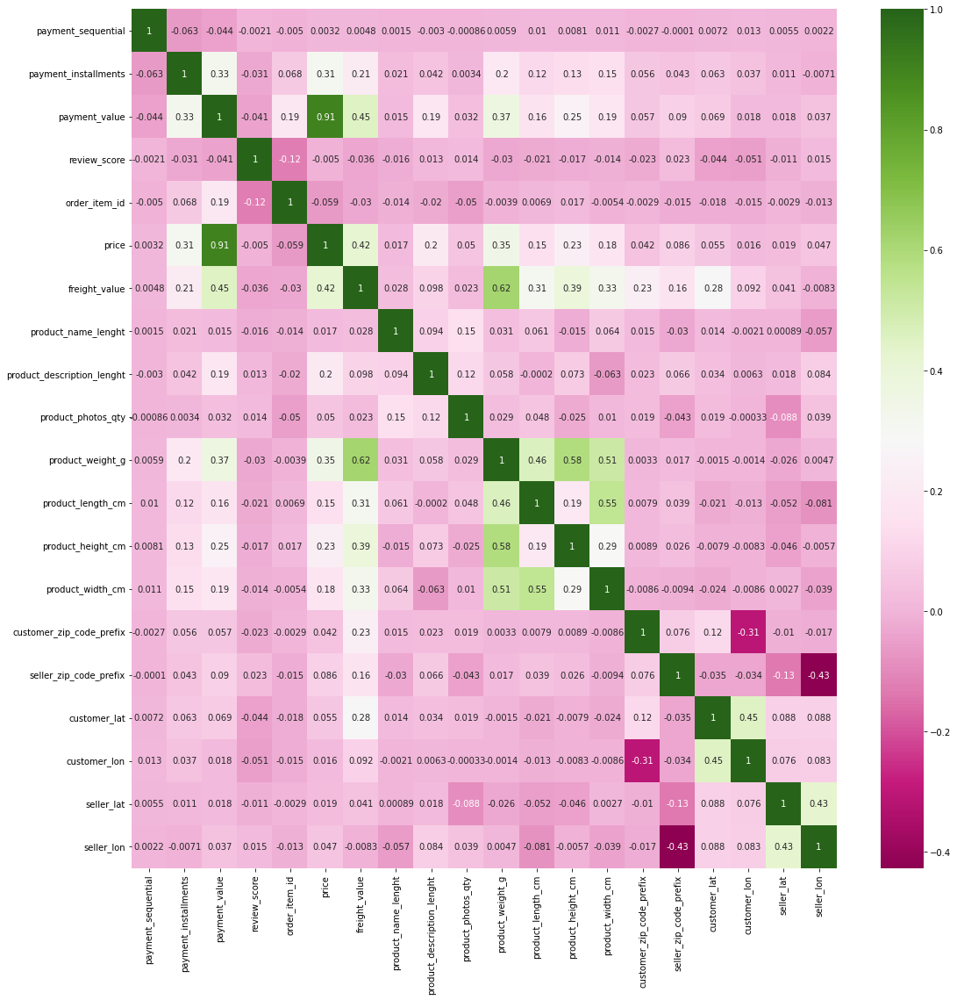

In [ ]:
# Correlation de Pearson
corrMatrix = df.corr()
plt.figure(figsize=(18,18))
sns.heatmap(corrMatrix, annot=True, cmap="PiYG")
plt.show()

Corrélations notables:
- prix et montant payé très corrélés (normal)
- taille, poids, coût de transport corrélés (normal)

## Pairplot

<Figure size 1800x1800 with 0 Axes>

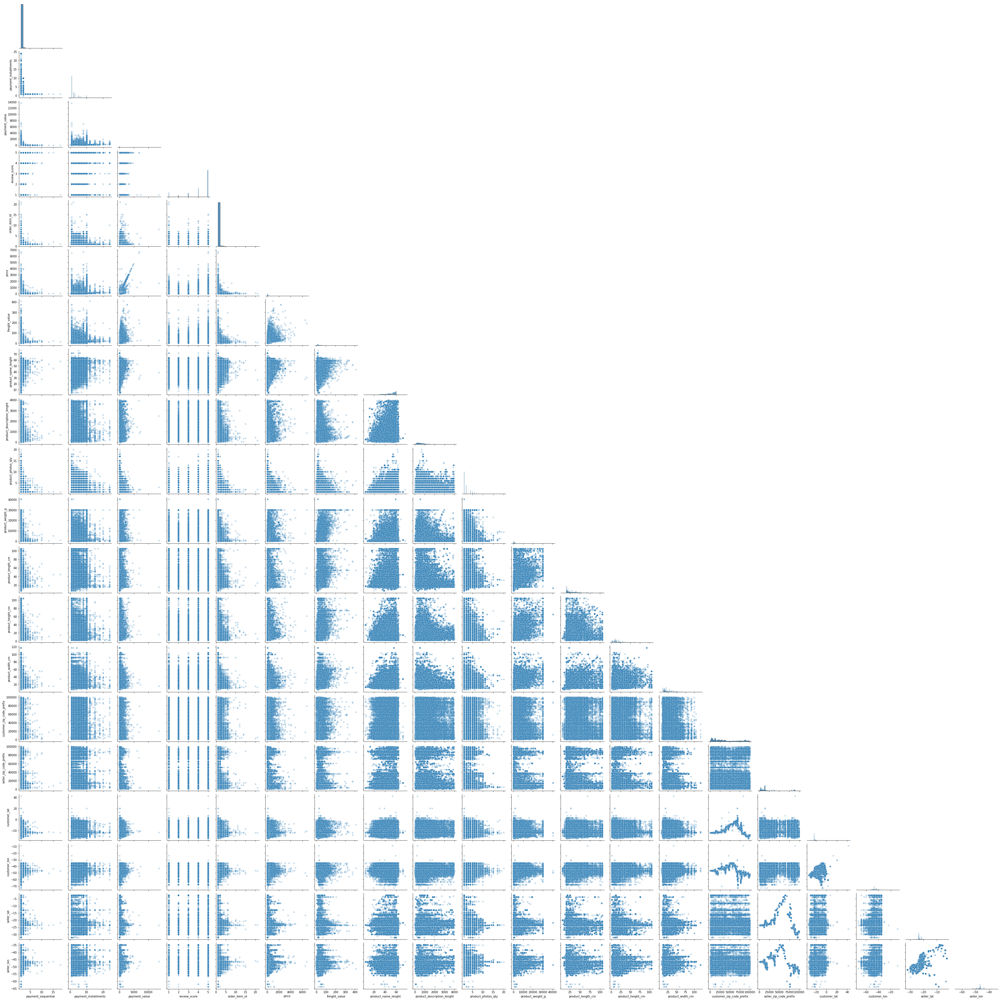

In [ ]:
# Pairplot
plt.figure(figsize=(25,25))
sns.pairplot(df, corner=True, plot_kws=dict(alpha=0.25))

RAS, le pairplot n'apporte rien de plus que la heatmap des corrélations.

## Aggrégation du dataset à l'individu et EDA des données des individus

On transforme/aggrège le dataset au niveau de l'individu, afin de menér l'étude et le clustering.

### Récence

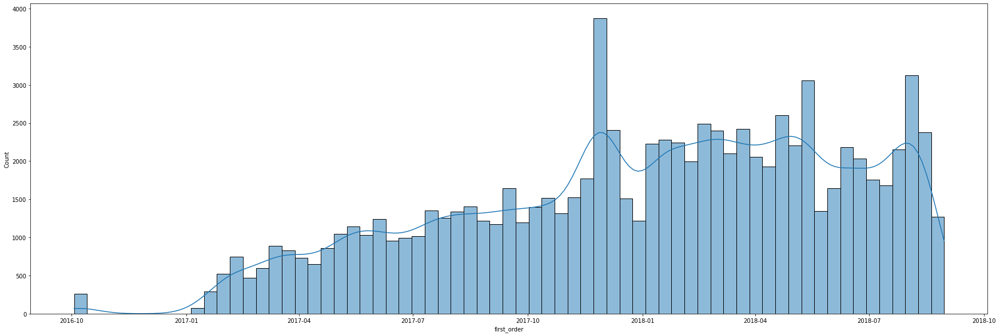

In [ ]:
# Date du premier et dernier achat 
last_order = df.groupby(['customer_unique_id'],as_index=False).agg(last_order=pd.NamedAgg(column='order_purchase_timestamp', aggfunc='max'))
first_order = df.groupby(['customer_unique_id'],as_index=False).agg(first_order=pd.NamedAgg(column='order_purchase_timestamp', aggfunc='min'))

# Nombre de jours depuis le dernier achats
start = '01-01-2017'
start_date = pd.to_datetime(start)

end = '01-01-2020'
end_date = pd.to_datetime(end)

n_days = (end_date - df['order_purchase_timestamp']).dt.days

# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=first_order, x='first_order', kde=True)

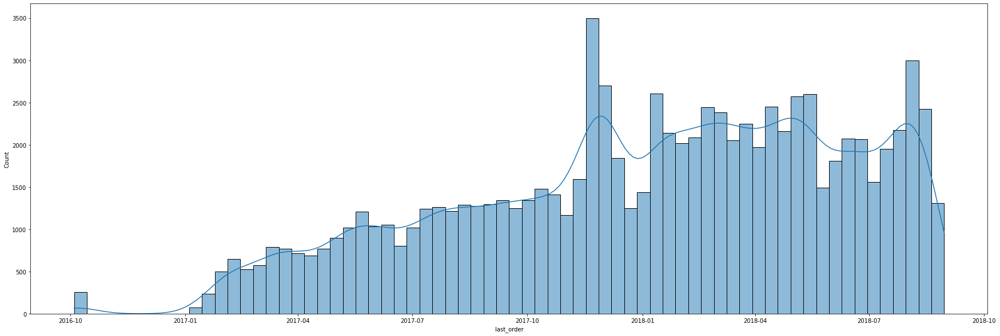

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=last_order, x='last_order', kde=True)

### Fréquence

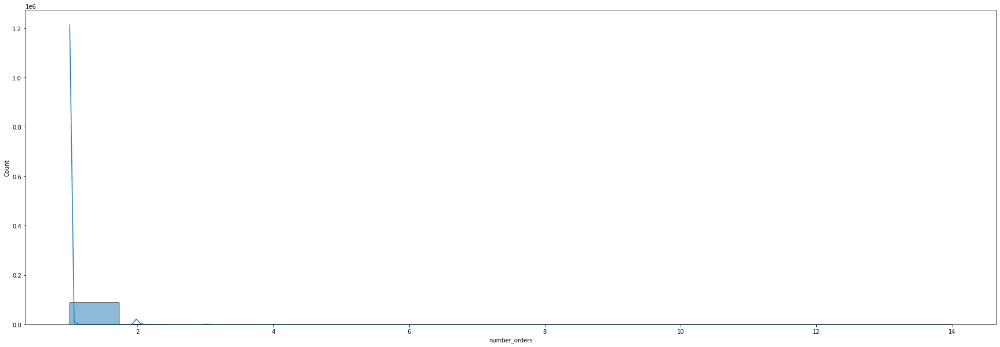

In [ ]:
# Nombre achats sur la periode
number_orders = df.groupby(['customer_unique_id'],as_index=False).agg(number_orders=pd.NamedAgg(column='order_id', aggfunc='nunique'))

# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=number_orders, x='number_orders', kde=True)

### Montant

In [ ]:
total_amount = df.groupby(['customer_unique_id'],as_index=False).agg(total_amount=pd.NamedAgg(column='payment_value', aggfunc='sum'))

average_cart = df.groupby(['customer_unique_id'],as_index=False).agg(average_cart=pd.NamedAgg(column='payment_value', aggfunc='mean'))

average_price = df.groupby(['customer_unique_id'], as_index=False).agg(average_price=pd.NamedAgg(column='price', aggfunc='mean'))

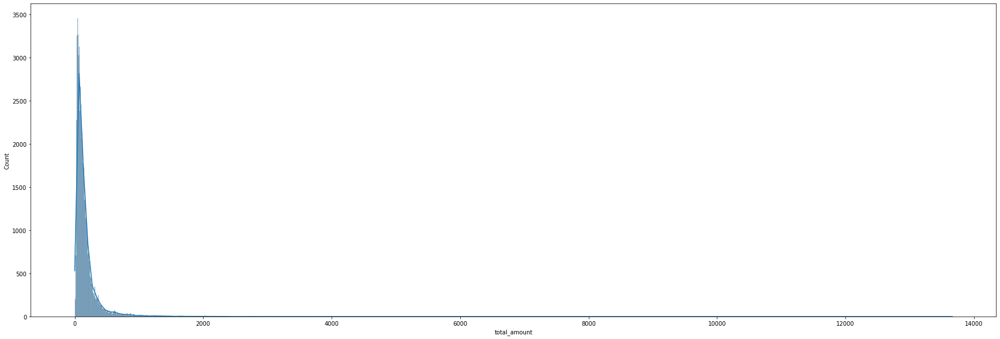

In [ ]:
plt.figure(figsize=(30,10))
sns.histplot(data=total_amount, x='total_amount', kde=True)

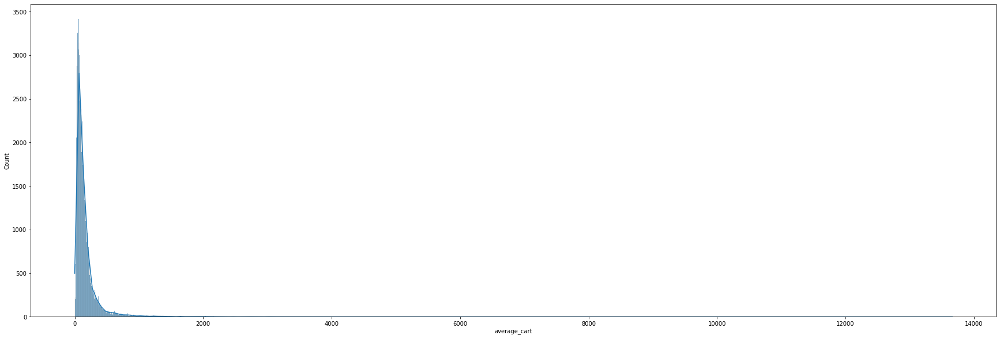

In [ ]:
plt.figure(figsize=(30,10))
sns.histplot(data=average_cart, x='average_cart', kde=True)

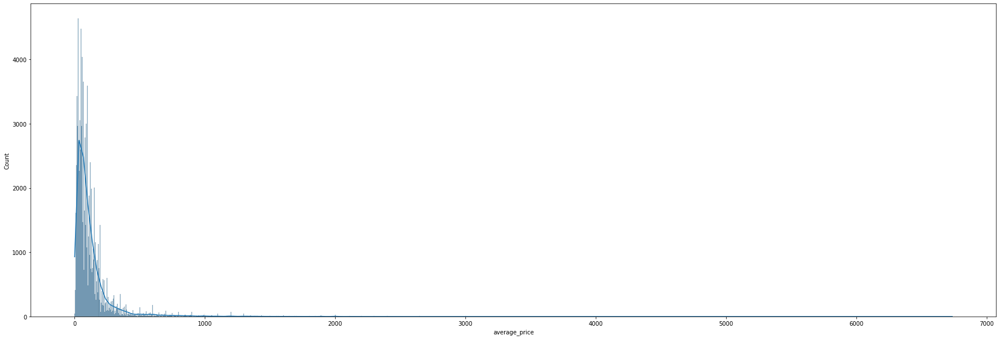

In [ ]:
plt.figure(figsize=(30,10))
sns.histplot(data=average_price, x='average_price', kde=True)

### Quantité

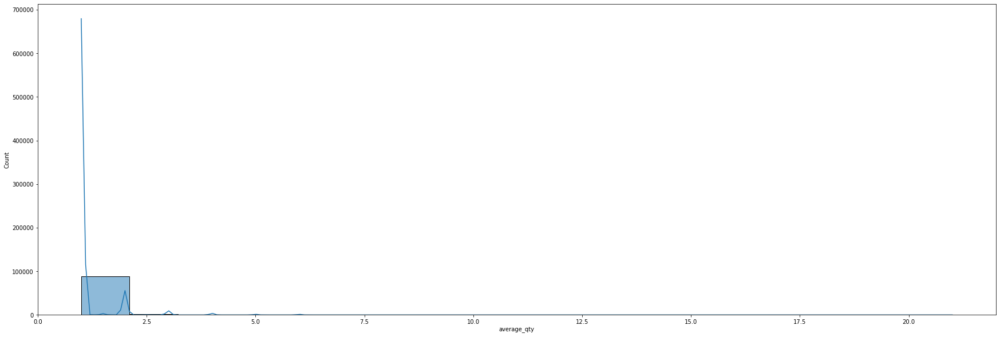

In [ ]:
average_qty = df.groupby(['customer_unique_id'],as_index=False).agg(average_qty=pd.NamedAgg(column='order_item_id', aggfunc='mean'))

plt.figure(figsize=(30,10))
sns.histplot(data=average_qty, x='average_qty', kde=True)

### Reviews

In [ ]:
average_review_score = df.groupby(['customer_unique_id'],as_index=False).agg(average_review_score=pd.NamedAgg(column='review_score', aggfunc='mean'))

number_reviews = df.groupby(['customer_unique_id'],as_index=False).agg(number_reviews=pd.NamedAgg(column='review_comment_message', aggfunc='count'))

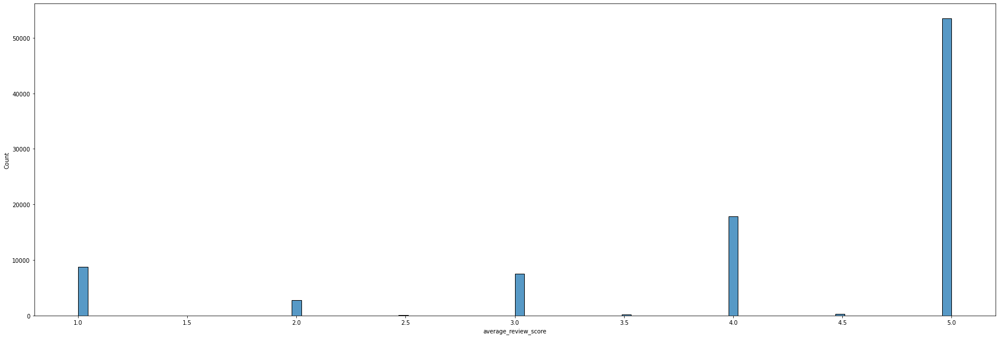

In [ ]:
plt.figure(figsize=(30,10))
sns.histplot(data=average_review_score, x='average_review_score')

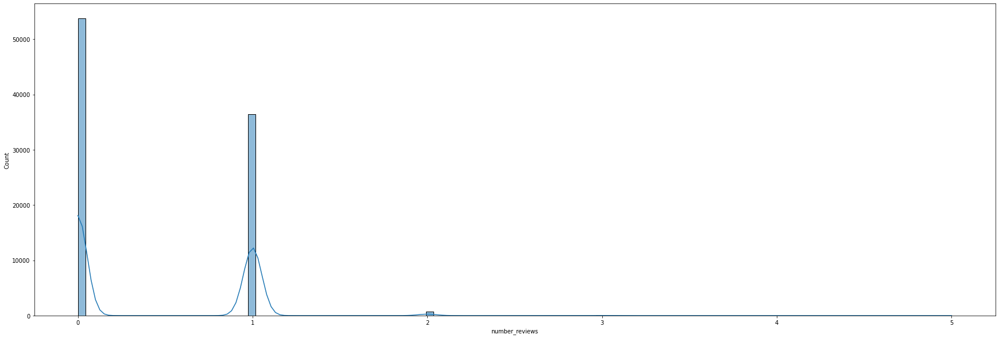

In [ ]:
plt.figure(figsize=(30,10))
sns.histplot(data=number_reviews, x='number_reviews', kde=True)

### Payments


In [ ]:
average_payment_sequential = df.groupby(['customer_unique_id'],as_index=False).agg(average_payment_sequential=pd.NamedAgg(column='payment_sequential', aggfunc='mean'))

average_payment_installments = df.groupby(['customer_unique_id'],as_index=False).agg(average_payment_installments=pd.NamedAgg(column='payment_installments', aggfunc='mean'))

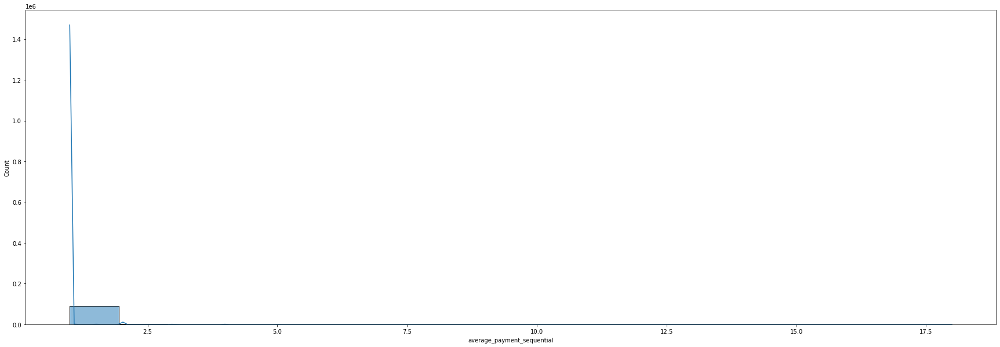

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_payment_sequential, x='average_payment_sequential', kde=True)

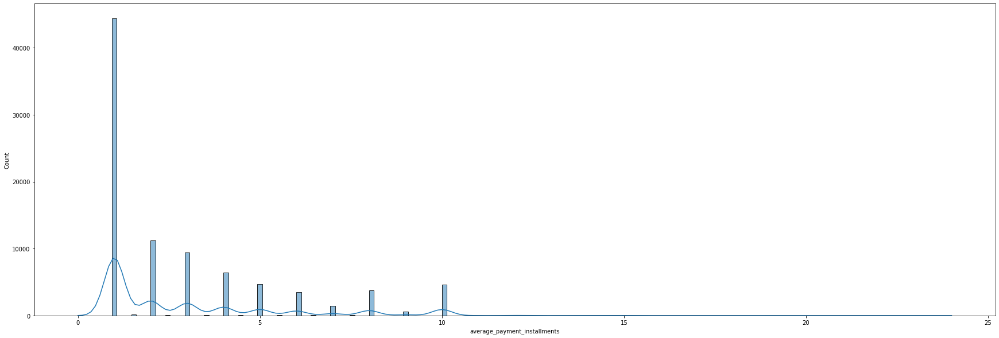

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_payment_installments, x='average_payment_installments', kde=True)

### Poids et volume

In [ ]:
average_freight_value = df.groupby(['customer_unique_id'],as_index=False).agg(average_freight_value=pd.NamedAgg(column='freight_value', aggfunc='mean'))

average_product_weight_g = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_weight_g=pd.NamedAgg(column='product_weight_g', aggfunc='mean'))

average_product_length_cm = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_length_cm=pd.NamedAgg(column='product_length_cm', aggfunc='mean'))
average_product_height_cm = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_height_cm=pd.NamedAgg(column='product_height_cm', aggfunc='mean'))
average_product_width_cm = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_width_cm=pd.NamedAgg(column='product_width_cm', aggfunc='mean'))

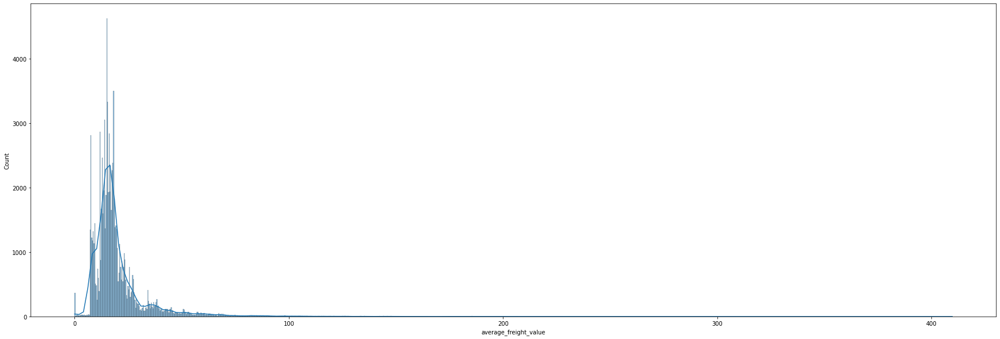

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_freight_value, x='average_freight_value', kde=True)

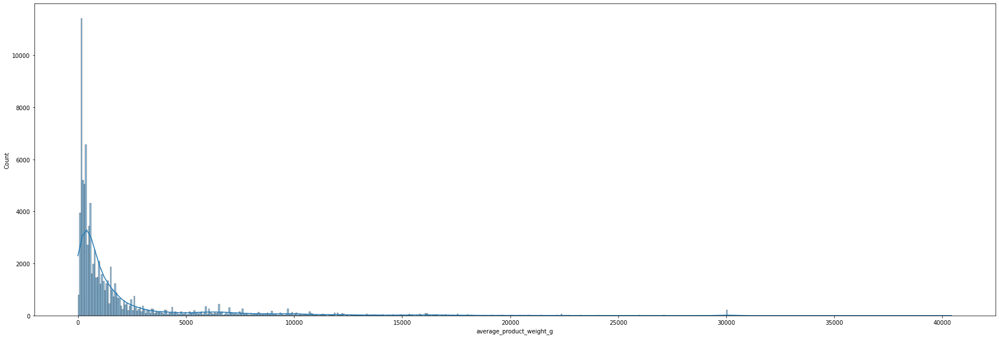

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_product_weight_g, x='average_product_weight_g', kde=True)

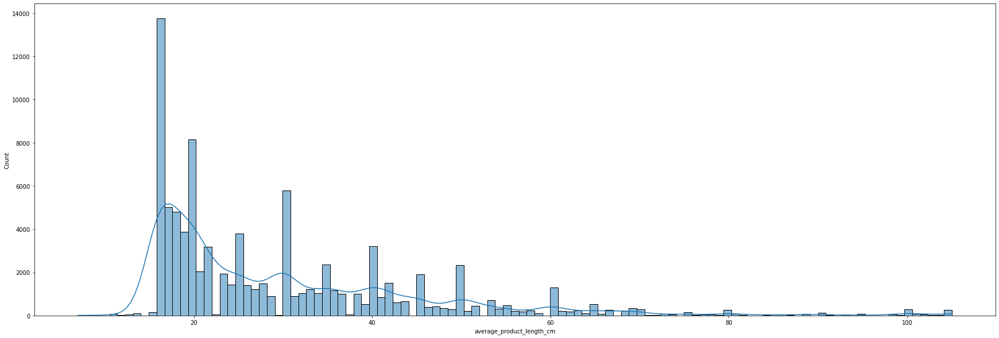

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_product_length_cm, x='average_product_length_cm', kde=True)

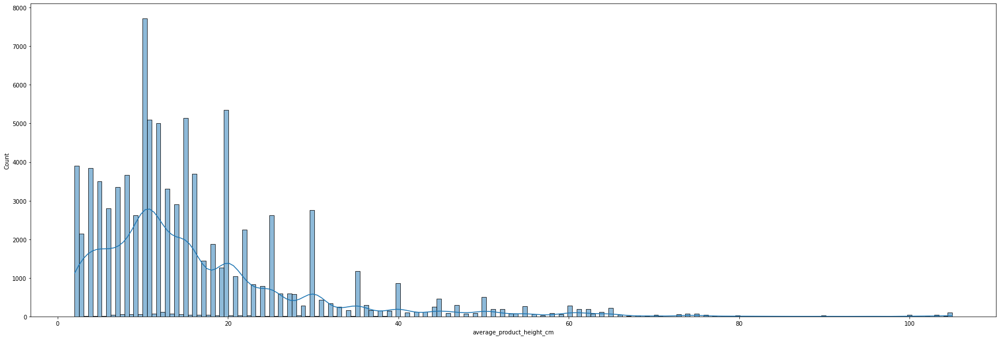

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_product_height_cm, x='average_product_height_cm', kde=True)

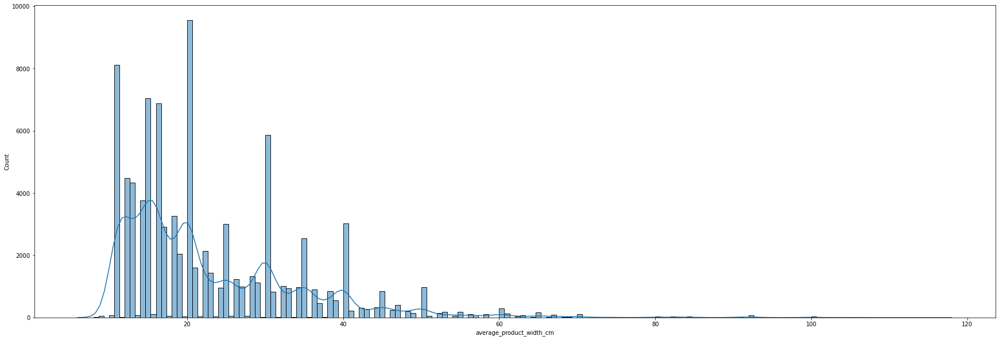

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_product_width_cm, x='average_product_width_cm', kde=True)

### Distance acheteur - vendeur

In [ ]:
# From https://kanoki.org/2019/12/27/how-to-calculate-distance-in-python-and-pandas-using-scipy-spatial-and-distance-functions/
def haversine_vectorize(lon1, lat1, lon2, lat2):
    """
    Calcule la distance en km entre deux points en partant de leurs coordonnées
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    newlon = lon2 - lon1
    newlat = lat2 - lat1

    haver_formula = (
        np.sin(newlat / 2.0) ** 2
        + np.cos(lat1) * np.cos(lat2) * np.sin(newlon / 2.0) ** 2
    )

    dist = 2 * np.arcsin(np.sqrt(haver_formula))
    km = 6367 * dist  # 6367 for distance in KM for miles use 3958
    return km


df["distance_km"] = haversine_vectorize(
    df["seller_lon"], df["seller_lat"], df["customer_lon"], df["customer_lat"]
)

average_distance = df.groupby(["customer_unique_id"], as_index=False).agg(average_distance=pd.NamedAgg(column="distance_km", aggfunc="mean"))

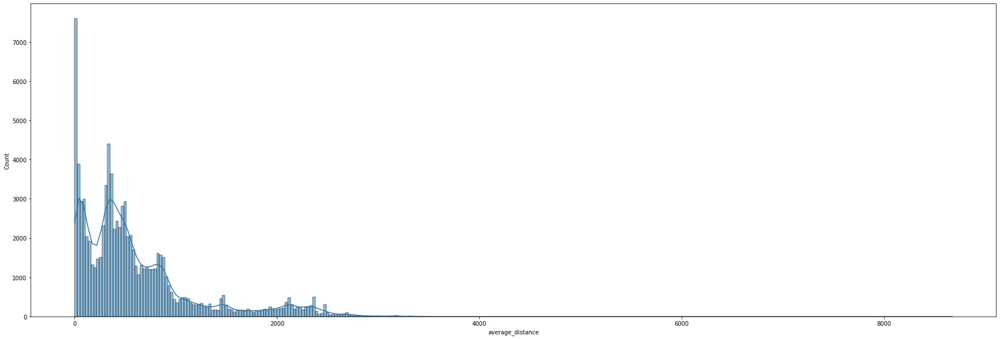

In [ ]:
# Histogramme
plt.figure(figsize=(30,10))
sns.histplot(data=average_distance, x='average_distance', kde=True)

### Etat

In [ ]:
customer_state = df.groupby(['customer_unique_id'],as_index=False).agg(customer_state=pd.NamedAgg(column='customer_state', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]))

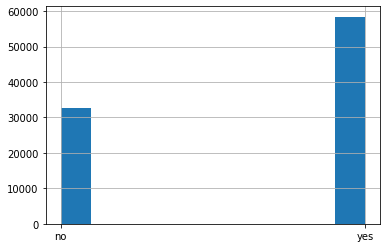

In [ ]:
df['order_different_state'] = np.where(df['customer_state'] == df['seller_state'], 0, 1)

order_different_state = df.groupby(['customer_unique_id'],as_index=False).agg(order_different_state=pd.NamedAgg(column='order_different_state', aggfunc=lambda x: 'yes' if x.sum() > 0 else 'no'))
order_different_state['order_different_state'].hist()

### Moyen de payement principal


In [ ]:
first_payment_type = df.groupby(['customer_unique_id'],as_index=False).agg(first_payment_type=pd.NamedAgg(column='payment_type', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]))

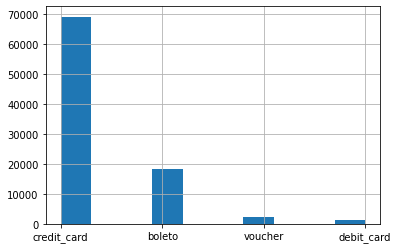

In [ ]:
first_payment_type['first_payment_type'].hist()

### Catégorie de produit la plus commune

In [ ]:
first_product_category = df.groupby(['customer_unique_id'],as_index=False).agg(first_product_category=pd.NamedAgg(column='product_category_name_english', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]))

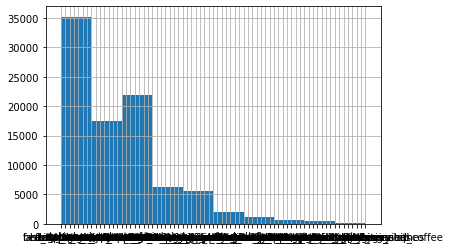

In [ ]:
first_product_category['first_product_category'].hist()

### Nom et reviews

In [ ]:
average_product_name_lenght = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_name_lenght=pd.NamedAgg(column='product_name_lenght', aggfunc='mean'))
average_product_description_lenght = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_description_lenght=pd.NamedAgg(column='product_description_lenght', aggfunc='mean'))
average_review_lenght = df.groupby(['customer_unique_id'],as_index=False).agg(average_review_lenght=pd.NamedAgg(column='review_comment_message', aggfunc=lambda x: np.mean(x.str.len())))

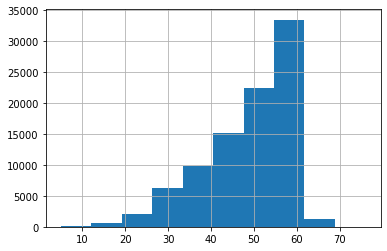

In [ ]:
average_product_name_lenght['average_product_name_lenght'].hist()

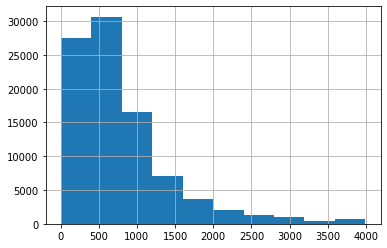

In [ ]:
average_product_description_lenght['average_product_description_lenght'].hist()

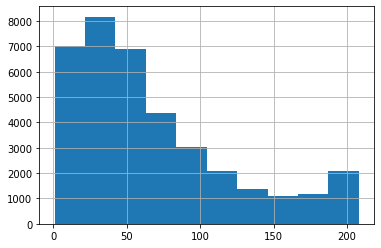

In [ ]:
average_review_lenght['average_review_lenght'].hist()

### Nombre de photos

In [ ]:
average_product_photos_qty = df.groupby(['customer_unique_id'],as_index=False).agg(average_product_photos_qty=pd.NamedAgg(column='product_photos_qty', aggfunc='mean'))

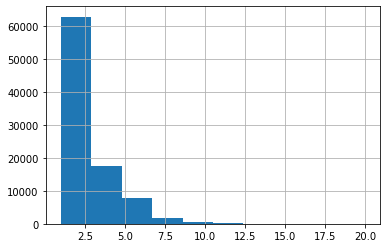

In [ ]:
average_product_photos_qty['average_product_photos_qty'].hist()

# Export


In [ ]:
# Export en .csv
df.to_csv("drive/MyDrive/POlist/df.csv", index=False)

# Fonction d'agrégation

Wrap de la creation des différentes features dans une fonction, qui sélectionne les commandes dans une fenêtre temporelles (cf. notebook 3):

In [ ]:
def dataset_aggregate(df, start_date, end_date):
    """
    Agrège le DataFrame au customer entre les dates de commandes renseignées. 
    Retourne l'id du customer et plusieurs variables agrègées.

    Args:
    - df: DataFrame à agrèger
    - start_date: filtre les commandes passées avant la date
    - end_date: filtre les commandes passées après la date

    Output: DataFrame agrègé au customer
    """

    # convertit les arguments en dates
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime(end)

    # Filtre le dataset sur les dates
    df = df[(df['order_purchase_timestamp'] >= start_date) 
        & (df['order_purchase_timestamp'] <= end_date)]

    # Calcul des features agrègées
    df_agg = df.groupby(['customer_unique_id'],as_index=False, sort=False).agg(
        last_order=pd.NamedAgg(column='order_purchase_timestamp', aggfunc='max'),
        first_order=pd.NamedAgg(column='order_purchase_timestamp', aggfunc='min'),
        number_orders=pd.NamedAgg(column='order_id', aggfunc='nunique'),
        total_amount=pd.NamedAgg(column='payment_value', aggfunc='sum'),
        average_cart=pd.NamedAgg(column='payment_value', aggfunc='mean'),
        average_price=pd.NamedAgg(column='price', aggfunc='mean'),
        average_qty=pd.NamedAgg(column='order_item_id', aggfunc='mean'),
        average_review_score=pd.NamedAgg(column='review_score', aggfunc='mean'),
        number_reviews=pd.NamedAgg(column='review_comment_message', aggfunc='count'),
        average_payment_sequential=pd.NamedAgg(column='payment_sequential', aggfunc='mean'),
        average_payment_installments=pd.NamedAgg(column='payment_installments', aggfunc='mean'),
        average_freight_value=pd.NamedAgg(column='freight_value', aggfunc='mean'),
        average_product_weight_g=pd.NamedAgg(column='product_weight_g', aggfunc='mean'),
        average_product_length_cm=pd.NamedAgg(column='product_length_cm', aggfunc='mean'),
        average_product_height_cm=pd.NamedAgg(column='product_height_cm', aggfunc='mean'),
        average_product_width_cm=pd.NamedAgg(column='product_width_cm', aggfunc='mean'),
        average_distance=pd.NamedAgg(column='distance_km', aggfunc='mean'),
        customer_state=pd.NamedAgg(column='customer_state', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]),
        order_different_state=pd.NamedAgg(column='order_different_state', aggfunc=lambda x: 'yes' if x.sum() > 0 else 'no'),
        first_payment_type=pd.NamedAgg(column='payment_type', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]),
        first_product_category=pd.NamedAgg(column='product_category_name_english', aggfunc=lambda x: np.nan if x.isnull().all() else x.value_counts().index[0]),
        average_product_name_lenght=pd.NamedAgg(column='product_name_lenght', aggfunc='mean'),
        average_product_description_lenght=pd.NamedAgg(column='product_description_lenght', aggfunc='mean'),
        average_review_lenght=pd.NamedAgg(column='review_comment_message', aggfunc=lambda x: np.mean(x.str.len())),
        average_product_photos_qty=pd.NamedAgg(column='product_photos_qty', aggfunc='mean')
        )

    # Nombre de jours depuis la dernière commande
    df_agg['days_since_last_order'] = end_date - df_agg['last_order']
    df_agg['days_since_last_order'] = pd.to_numeric(df_agg['days_since_last_order'].dt.days, downcast='integer')

    # Taux de review
    df_agg['review_rate'] = df_agg['number_reviews'] / df_agg['number_orders']

    return df_agg

In [ ]:
# Test de la fonction
start = '01-01-2017'

end = '01-01-2020'

df_final = dataset_aggregate(df, start, end)
df_final

,customer_unique_id,last_order,first_order,number_orders,total_amount,average_cart,average_price,average_qty,average_review_score,number_reviews,...,customer_state,order_different_state,first_payment_type,first_product_category,average_product_name_lenght,average_product_description_lenght,average_review_lenght,average_product_photos_qty,days_since_last_order,review_rate
0,397c24b06740a0578e1e4ef14ab7dc4e,2018-04-13,2018-04-13,1,46.96,46.96,24.90,1.0,5.0,1,...,MS,yes,credit_card,sports_leisure,52.0,1392.0,48.0,1.0,628,1.0
1,3cde4b009a25beebc485cf2059ddc991,2018-03-17,2018-03-17,1,38.13,38.13,19.90,1.0,3.0,0,...,MS,yes,boleto,bed_bath_table,52.0,153.0,NaN,1.0,655,0.0
2,469356420bccdecae3c5a3f9d8089ddd,2018-02-13,2018-02-13,1,76.17,76.17,59.99,1.0,4.0,0,...,MS,yes,credit_card,bed_bath_table,57.0,504.0,NaN,1.0,687,0.0
3,a2353d74607f052ae9640d3af3b81132,2018-02-26,2018-02-26,1,387.14,387.14,369.80,1.0,4.0,0,...,MS,yes,credit_card,watches_gifts,50.0,464.0,NaN,2.0,674,0.0
4,99f0c33abddbeb5b72869e0e505453a9,2017-11-25,2017-11-25,1,24.30,24.30,9.20,1.0,5.0,1,...,MS,yes,boleto,auto,60.0,324.0,21.0,1.0,767,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90761,31e412b9fb766b6794724ed17a41dfa6,2017-12-14,2017-12-14,1,1014.02,1014.02,59.00,14.0,1.0,0,...,SP,no,boleto,garden_tools,56.0,348.0,NaN,2.0,748,0.0
90762,f7ea4eef770a388bd5b225acfc546604,2018-02-21,2018-02-21,1,528.78,528.78,29.99,14.0,1.0,1,...,SP,no,credit_card,telephony,55.0,55.0,75.0,1.0,679,1.0
90763,11f97da02237a49c8e783dfda6f50e8e,2017-01-31,2017-01-31,1,783.00,783.00,51.00,15.0,5.0,0,...,GO,yes,credit_card,garden_tools,43.0,369.0,NaN,2.0,1065,0.0
90764,c402f431464c72e27330a67f7b94d4fb,2018-02-23,2018-02-23,1,2202.40,2202.40,100.00,20.0,1.0,0,...,SP,no,boleto,computers_accessories,43.0,452.0,NaN,1.0,677,0.0


In [ ]:
# Info
df_final.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90766 entries, 0 to 90765
Data columns (total 28 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   customer_unique_id                  90766 non-null  object        
 1   last_order                          90766 non-null  datetime64[ns]
 2   first_order                         90766 non-null  datetime64[ns]
 3   number_orders                       90766 non-null  int64         
 4   total_amount                        90766 non-null  float64       
 5   average_cart                        90766 non-null  float64       
 6   average_price                       90766 non-null  float64       
 7   average_qty                         90766 non-null  float64       
 8   average_review_score                90766 non-null  float64       
 9   number_reviews                      90766 non-null  int64         
 10  average_payment_sequen

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f855d88d850>,
      dtype=object)

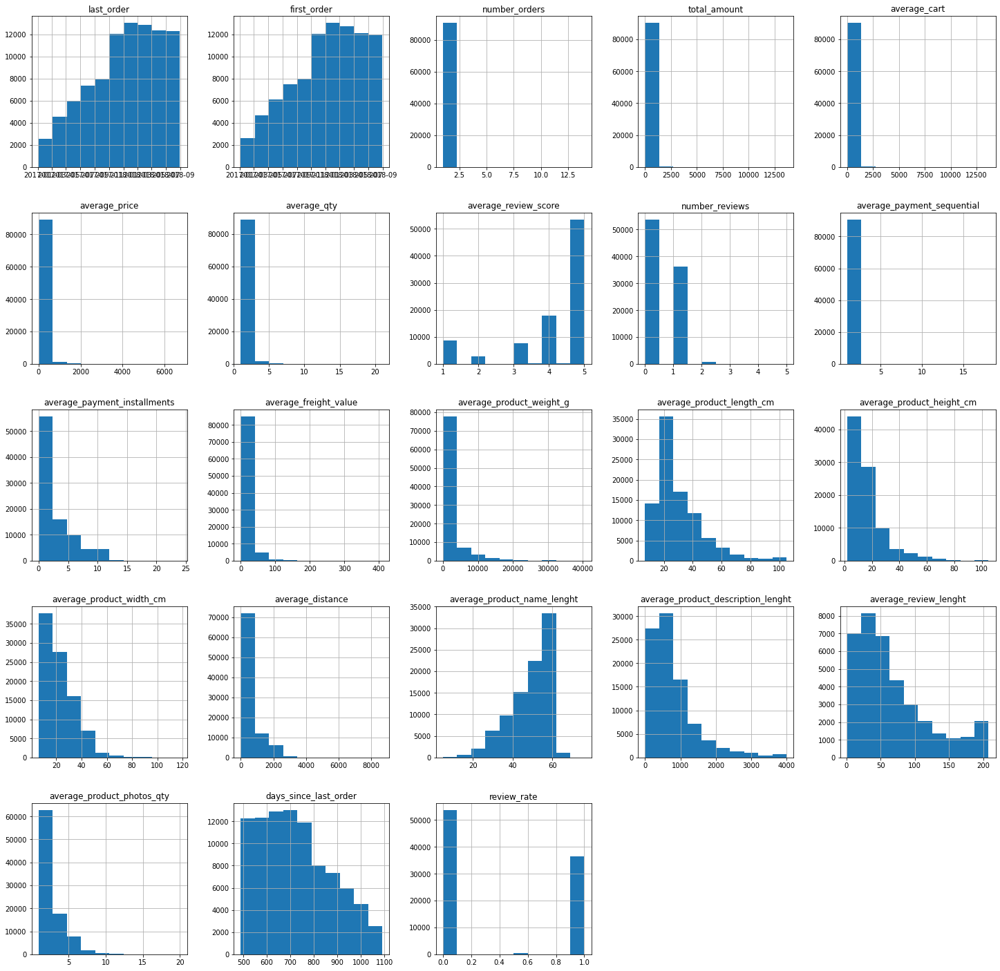

In [ ]:
# Check
df_final.hist(figsize=(25,25))

## Corrélations

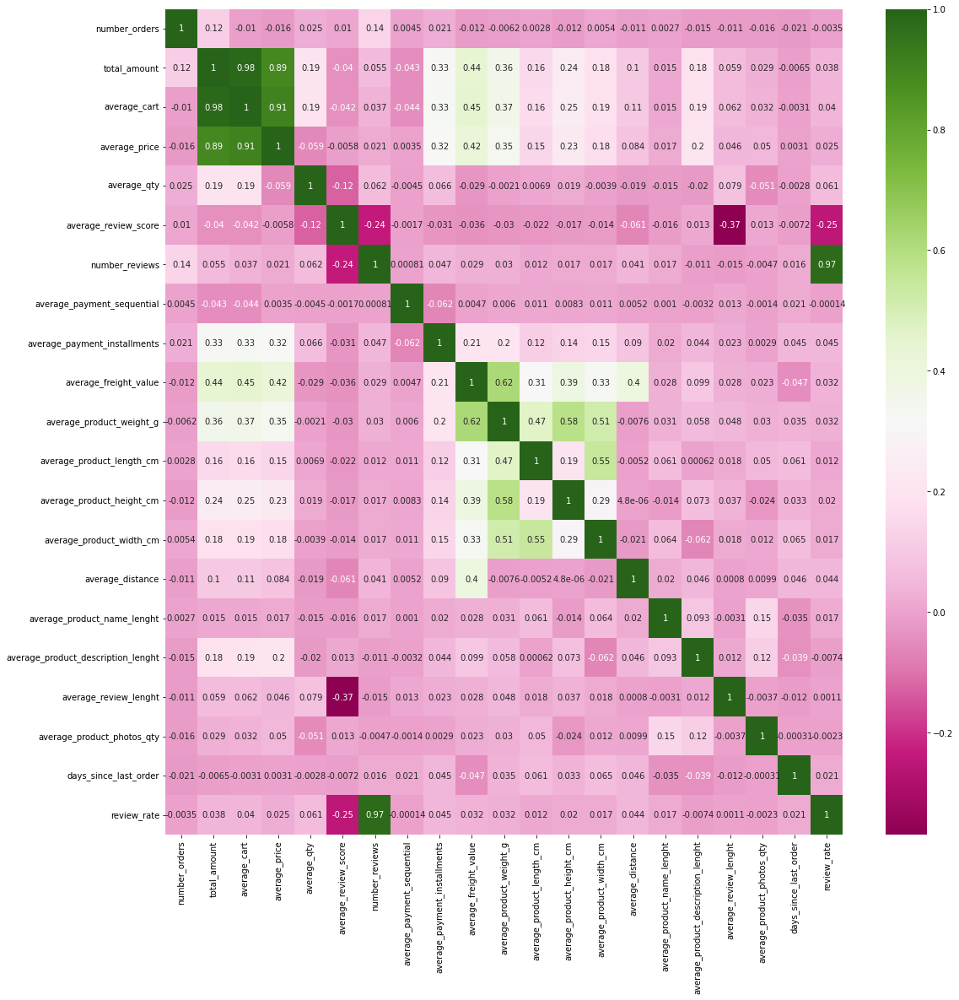

In [ ]:
# Correlation de Pearson
corrMatrix = df_final.corr()
plt.figure(figsize=(18,18))
sns.heatmap(corrMatrix, annot=True, cmap="PiYG")
plt.show()

## Pairplot

<Figure size 1800x1800 with 0 Axes>

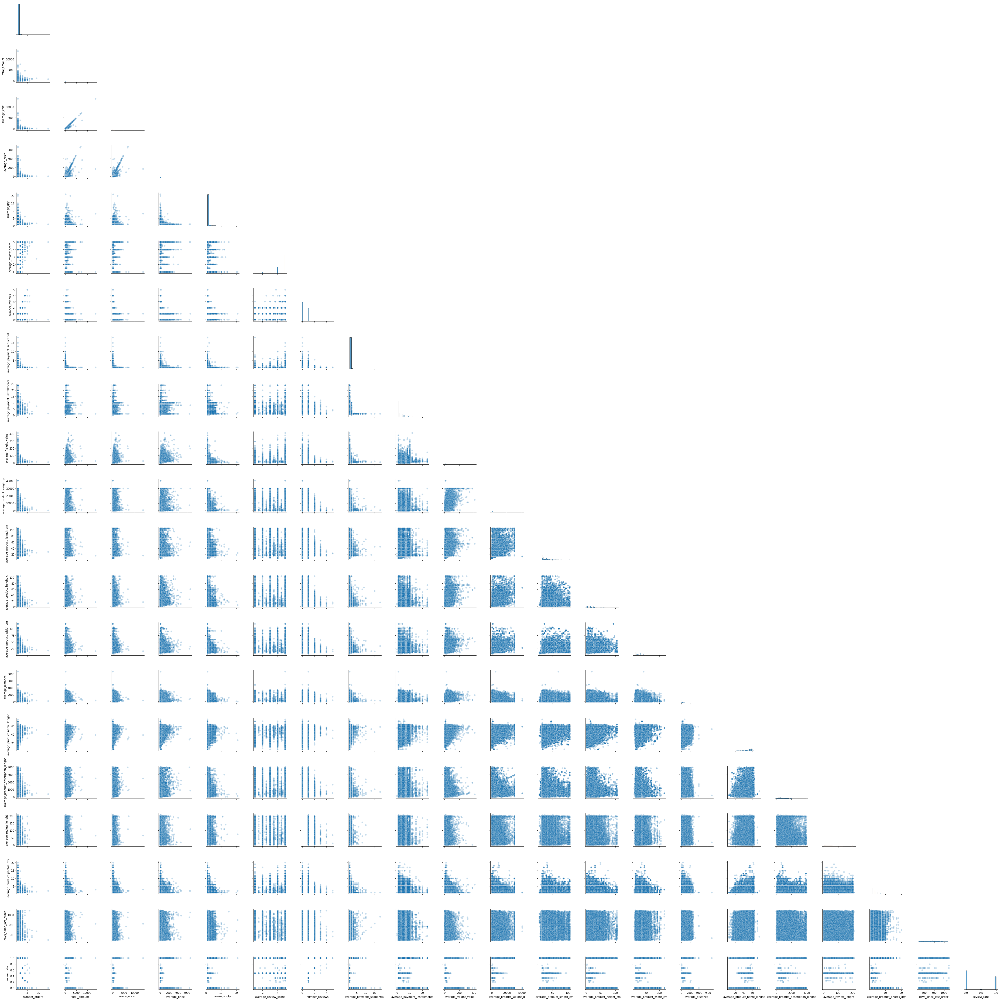

In [ ]:
# Pairplot
plt.figure(figsize=(25,25))
sns.pairplot(df_final, corner=True, plot_kws=dict(alpha=0.25))